<a href="https://colab.research.google.com/github/shun601/4th-tellus-satellite-challenge/blob/main/predict.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### 原初データ提供者：国立研究開発法人宇宙航空研究開発機構    
#### Original data provided by JAXA

# 1 はじめに
本ファイルは、[「The 4th Tellus Satellite Challenge：海岸線の抽出」](https://signate.jp/competitions/284)コンペにて最終投稿の推論を行ったコードです。  

# 2 推論のコード詳細
以下に、実装したコードを記します。

## 2.1 外部ライブラリのインストール

In [ ]:
# コードスタイルのチェックに使う
!pip install pycodestyle flake8 pycodestyle_magic
%load_ext pycodestyle_magic

     |████████████████████████████████| 51kB 3.9MB/s 
     |████████████████████████████████| 81kB 4.0MB/s 
     |████████████████████████████████| 71kB 8.2MB/s 


In [ ]:
# 外部ライブラリをインストール (2020/10/17時点の最新Ver)

# データオーギュメンテーション用のライブラリ Albumentations
!pip install albumentations==0.4.6

# 学習済みのセグメンターションモデルをインポートするためのライブラリ
!pip install segmentation-models-pytorch==0.1.2

# PyTorchのラッパーライブラリ Catalyst
!pip install catalyst==20.10.1

     |████████████████████████████████| 122kB 5.7MB/s 
     |████████████████████████████████| 952kB 26.0MB/s 
  Created wheel for albumentations: filename=albumentations-0.4.6-cp36-none-any.whl size=65165 sha256=de3d70cf8a993432e96ff5bc903974b39afd615506a67219b4eeae5c72e8cb7a
  Stored in directory: /root/.cache/pip/wheels/c7/f4/89/56d1bee5c421c36c1a951eeb4adcc32fbb82f5344c086efa14
Successfully built albumentations
  Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12
     |████████████████████████████████| 61kB 3.0MB/s 
     |████████████████████████████████| 61kB 6.2MB/s 
     |████████████████████████████████| 163kB 20.5MB/s 
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.6.3-cp36-none-any.whl size=12421 sha256=718c3c6d961c6dbd0bc3b913a1bfd854741f04

## 2.2 モジュールのインポート

In [ ]:
# 標準ライブラリのインポート
import json
import os
from pathlib import Path
import random

# OpenCV, matplotlib, numpy, sklearnのインポート
import cv2
import matplotlib.pyplot as plt
import numpy as np

# PyTorchのインポート
import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn
from torch.nn import functional as F

# Catalyst(PyTorchのラッパーライブラリ)のインポート
import catalyst
from catalyst.dl import SupervisedRunner

# Albumentationsのインポート（データオーギュメンテーション用）
import albumentations as albu
from albumentations.pytorch import ToTensor

# 学習済みのセグメンターションモデルをインポートするためのライブラリ
import segmentation_models_pytorch as smp

## 2.3 google drive マウント

In [ ]:
from google.colab import drive


drive.mount('/gdrive')j

Mounted at /gdrive


## 2.4 データパス準備

In [ ]:
# 自分の環境に合わせて下記のパスを変更すること
# ROOTをpathlibのPathオブジェクトで取得
ROOT = Path("/gdrive/My Drive/Colab Notebooks/signate/Tellus4/code/")

# テストデータのディレクトリのパス(Pathオブジェクト)
test_image_path = ROOT / "test_image"

In [ ]:
# テストデータのディレクトリを確認
print(test_image_path)

/gdrive/My Drive/Colab Notebooks/signate/Tellus4/code/test_image


## 2.5 クラス、関数の定義

### 2.5.2 testデータと推論結果を可視化する関数

In [ ]:
def show_predictions(name, image, mask):
    """
    テストデータと推論結果を表示する関数。
    データの可視化で使用される。

    Parameters:
    -------------------------------------------------------
    name : -> string型
        画像のファイル名。画像のタイトルとして使用される。
    image : -> numpy.ndarray型
        テストデータ
    mask : -> numpy.ndarray型
        推論されたアノテーション

    Returns:
    --------------------------------------------------------
        --> None

    """
    # テストデータの表示
    plt.figure(figsize=(10, 14))
    plt.subplot(1, 2, 1)

    # imageが3チャネル（RGB）の場合
    if image.ndim == 3:
        # imageをRGBで表示
        plt.imshow(image)
    # imageが3チャネル（RGB）でない場合
    else:
        # カラーマップはgrayで表示
        plt.imshow(image, cmap="gray")
    plt.title(f"Image: {name}")

    # 推論結果の表示
    plt.subplot(1, 2, 2)
    plt.imshow(mask)
    plt.title(f"Predicted mask: {name}")


### 2.5.3 Datasetクラス

In [ ]:
class SegmentationDataset(Dataset):
    """
    セマンティックセグメンテーション用のDatasetを作成するクラス。
    PyTorchのDatasetクラスを継承。

    Attributes:
    -----------------------------------------------------
    images : -> list型
            テストデータのパス(Pathオブジェクト)を格納したリスト
    transforms; -> function型
            実行するtransform関数(デフォルトはNone)
    """
    def __init__(self, images, transforms=None):
        """
        Parameters:
        -----------------------------------------------------
        images : -> list型
            テストデータのパス(Pathオブジェクト)を格納したリスト
        transforms; -> function型
            実行するtransform関数(デフォルトはNone)

        """
        self.images = images
        self.transforms = transforms

    def __len__(self):
        """ 画像の枚数を返す """
        return len(self.images)

    def __getitem__(self, idx):
        """
        テストデータ、ファイル名をdict型変数resultに格納して、
        戻り値としてresultを返す特殊メソッド

        Return:
        -----------------------------------------------------
        result : -> dict型
            {image: 学習データ、filname: ファイル名}
        """
        # image_pathはpathlibモジュールのPathオブジェクト
        image_path = self.images[idx]
        # OpenCVでテストデータを読み込み、numpy.ndarrayに変換する
        image = cv2.imread(str(image_path))

        image = image[:, :, 0:1]
        # keyを'image', valueをテストデータ(numpy.ndarray)として、dict型変数resultを定義
        result = {"image": image}

        # transformsがNoneでなければ、dict型変数resultをアンパッキングし(**はdict型のアンパッキングオペレータ)、
        # imageにtransform関数を実行する
        if self.transforms is not None:
            result = self.transforms(**result)

        # keyを'filename', valueをテストデータのファイル名(string型)として、dict型変数resultに要素を追加
        result["filename"] = image_path.name

        return result

### 2.5.4 Augmentations

In [ ]:
def pre_transforms(image_size):
    """画像をimage_size x image_sizeにリサイズする関数"""
    #  p : probability of applying the transform. Default: 1.
    return [albu.Resize(image_size, image_size, p=1)]


def post_transforms():
    """ テスト画像のTensor化 """
    return [ToTensor()]


def compose(transforms_to_compose):
    """ combine all augmentations into single pipeline """
    result = albu.Compose([
      item for sublist in transforms_to_compose for item in sublist
    ])
    return result

### 2.5.5 推論結果をアンサンブルさせる関数

In [ ]:
def ensemble_prediction(idx, predictions, is_choice_sea_only=False):
    """
    推論結果をアンサンブルさせる関数。

    Parameters:
    -----------------------------------------------------
    idx -> int型
        テストデータの番号
    predictions : -> dict型
        テストデータの推論結果を格納したdict型変数
    is_choice_sea_only : -> Boolean型
        Trueの場合、海の推論結果のみを抽出する。

    Returns:
    -----------------------------------------------------
        アンサンブルした推論結果(torch.Tensor型)
    """
    ensemble_count = 0

    for weight_num, prediction in predictions.items():
        logits = prediction[idx]

        if is_choice_sea_only:
            # 海クラス(1)のみを抽出する。
            logits = logits[1]

        if weight_num == 0:
            mask_ = torch.from_numpy(logits).sigmoid()
            ensemble_count += 1
        else:
            mask_ += torch.from_numpy(logits).sigmoid()
            ensemble_count += 1

    return mask_ / ensemble_count

### 2.5.6 testデータの推論結果から海岸線の座標を抽出する関数

In [ ]:
def _get_anno_dict(mask, filename, offset=None, is_print_point_size=False):
    """
    get_filename_anno関数で使用されるヘルパー関数

    Parameters:
    --------------------------------
    mask: -> numpy.ndarray型
        推論したマスク(Tensor)を、[0, 255]で2値化し、numpy.ndarrayに変換したマスク画像
    filename: -> str型
        テストの元画像(tifファイル)のファイル名
    offset: -> tuple型 or None型
        余白カット時のオフセット量（x, y）
        None型の場合は、オフセットしない。
    is_print_point_size: -> bool型
        予測した海岸線の総ポイント数を表示するかどうか(デフォルトはFalse: 表示しない)

    Returns
    ---------------------------------
    out_dict: -> dict型
        テストデータのファイル名(str型)と、予測した海岸線の全座標(list型)を格納したdict
    """
    # 予測結果の同じshapeで、要素0のnumpy.ndarrayを用意
    data = np.zeros_like(mask)
    # maskの差分(diff)を取ることで境界線（点）を抽出  行方向
    data_diff_ax0 = np.diff(mask, axis=0)
    # maskの差分(diff)を取ることで境界線（点）を抽出  列方向
    data_diff_ax1 = np.diff(mask, axis=1)
    # 境界線（点）をTrueにそれ以外をFalseに変換  行方向
    data_diff_ax0 = np.where(data_diff_ax0 != 0, True, False)
    # 境界線（点）をTrueにそれ以外をFalseに変換  列方向
    data_diff_ax1 = np.where(data_diff_ax1 != 0, True, False)
    # 行方向の点を付与
    data[:-1, :] += data_diff_ax0
    # 列方向の点を付与
    data[:, :-1] += data_diff_ax1
    # 境界線（点）のindexを取得  タプル(行(y), 列(x))で返される
    ret = np.where(data != False)

    # 余白カット時のpointオフセット読み込み
    if offset is None:
        offset_h, offset_w  = 0, 0
    else:
        offset_h, offset_w  = offset

    point_list = []
    for row, col in zip(*ret):
        # 座標[x座標(水平),y座標(垂直)]を、point_listに格納
        point_list.append([int(col + offset_w), int(row + offset_h)])

    if is_print_point_size:
        # コンペのルールで予測点は30,000点を超えてはいけないので、確認する。
        print("Point Size : {}".format(len(point_list)))

    # filenameと座標をペアで辞書型に格納
    out_dict = {filename: point_list}

    return out_dict


def get_filename_anno(test_idx, offset_list, predictions, threshold=0.5):
    """
    各テストデータの推論結果から海岸線の座標を抽出し、dict型変数にそれぞれ格納する関数。
    _get_anno_dict関数を実行する。

    Parameters:
    ---------------------------------
    test_idx : -> int型
        テストデータの番号
    offset_list : -> list型
        tuple型またはNone型がoffset_listには入っている。
        各要素は、_get_anno_listに引数として渡される。
    predictions : -> dict型
        テストデータの推論結果を格納したdict型変数
    threshold: -> float型
        推論結果をフィルターする閾値
        0〜１の値をとる

    Returns:
    ---------------------------------
    out_dict: -> dict型
        テストデータのファイル名(str型)と、予測した海岸線の全座標(list型)を格納したdict
        _get_anno_dict関数を実行して得られる。
    """

    # 推論結果をアンサンブルしてマスク画像を生成
    img_mask = ensemble_prediction(test_idx, predictions, is_choice_sea_only=True)

    # ２値化
    # アンサンブルさせた予測結果(Tensor型)を、threshold以上でフィルタリング(torch.uint8に変換され２値化される)
    #   --> 64ビット浮動小数点のTensor型に変換
    mask_filter = np.greater(img_mask, threshold).type(torch.DoubleTensor)

    # Batch, Ch軸を追加（F.interpolateを適用するのに必要）
    mask_filter = mask_filter.unsqueeze(0).unsqueeze(0)

    # testデータ 元画像サイズ取得
    test_path =TEST_IMAGES[test_idx]
    img_org = cv2.imread(str(test_path))

    # F.interpolateを適用し、予測したmaskデータ(Tensor型)を元画像サイズにリサイズする。
    mask_filter = F.interpolate(input=mask_filter,
                                size=img_org.shape[0:2],
                                mode='bilinear',
                                align_corners=False)

    # detachで勾配情報を切り離し、Tensor型からnumpy.ndarrayに変換
    mask_filter = mask_filter.detach().cpu().numpy()
    # Batch, Ch軸の次元を削除
    mask_filter = mask_filter.squeeze(0).squeeze(0)

    # 元画像サイズに合わせた後、再度2値化
    mask_filter = np.greater(mask_filter, 0.5)
    # [0, 255]に変換
    mask_filter = mask_filter.astype(np.uint8) * 255

    # テストデータのファイル名
    tif_name = f"test_{test_idx:02d}.tif"
    # _get_anno_dict()を実行し、テストデータのファイル名(str型)と、予測した海岸線の全座標(list型)を格納したdictを生成する
    out_dict = _get_anno_dict(mask=mask_filter,
                              offset=offset_list[test_idx],
                              filename=tif_name,
                              is_print_point_size=True)
    return out_dict

## 2.6 Transformの実装

In [ ]:
# テスト画像を640x640にリサイズする
IMAGE_SIZE_NUM = 640

test_transforms = compose([pre_transforms(image_size=IMAGE_SIZE_NUM),
                           post_transforms()])

## 2.7 testデータで推論

In [ ]:
TEST_IMAGES = sorted(test_image_path.glob("*.png"))

# 重みのパスを取得
logdir_header = 'segmentation_1106_best_LOGO'
weight_dirs = [f"{ROOT}/logs/{logdir_header}_{i}/best.pth" for i in range(1, 9)]

# 予測結果を格納する空のdict型変数を用意する
predictions = {}

# 推論実行
for weight_num in range(len(weight_dirs)):

    test_dataset = SegmentationDataset(TEST_IMAGES, transforms=test_transforms)
    
    # ミニバッチを作成する際の並列実行数
    num_workers = 4
    # ミニバッチサイズ
    batch_size = 5

    # DataLoaderを用意
    infer_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers
    )

    # 学習済モデルの読み込み
    model = smp.FPN(encoder_name="efficientnet-b5", classes=3, in_channels=1)

    # 推論用runnerを設定
    runner = SupervisedRunner(input_key="image")

    # 任意の学習した重みのパスを読み込む
    param_path = str(weight_dirs[weight_num])

    # this get predictions for the whole loader
    prediction = np.vstack(list(map(lambda x: x["logits"].cpu().numpy(),
                                    runner.predict_loader(loader=infer_loader,
                                                          model=model,
                                                          resume=param_path))))
    # 予測結果を辞書に格納する
    predictions[weight_num] = prediction

# 予測結果の確認
for weight_num, prediction in predictions.items():
    print('weight_num: {}\ntype: {}\nshape: {}\n'.format(weight_num,
                                                         type(prediction),
                                                         prediction.shape))

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b5-b6417697.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b5-b6417697.pth



weight_num: 0
type: <class 'numpy.ndarray'>
shape: (30, 3, 640, 640)

weight_num: 1
type: <class 'numpy.ndarray'>
shape: (30, 3, 640, 640)

weight_num: 2
type: <class 'numpy.ndarray'>
shape: (30, 3, 640, 640)

weight_num: 3
type: <class 'numpy.ndarray'>
shape: (30, 3, 640, 640)

weight_num: 4
type: <class 'numpy.ndarray'>
shape: (30, 3, 640, 640)

weight_num: 5
type: <class 'numpy.ndarray'>
shape: (30, 3, 640, 640)

weight_num: 6
type: <class 'numpy.ndarray'>
shape: (30, 3, 640, 640)

weight_num: 7
type: <class 'numpy.ndarray'>
shape: (30, 3, 640, 640)



## 2.8 推論結果を可視化

### 2.8.1 testデータと推論結果を分けて可視化

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



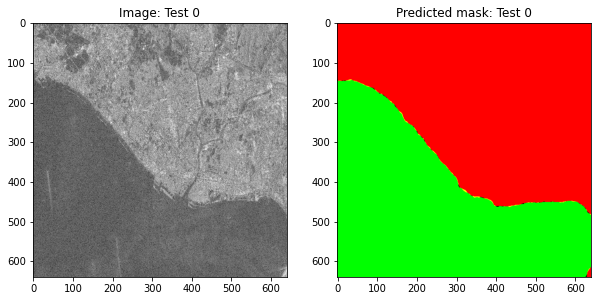

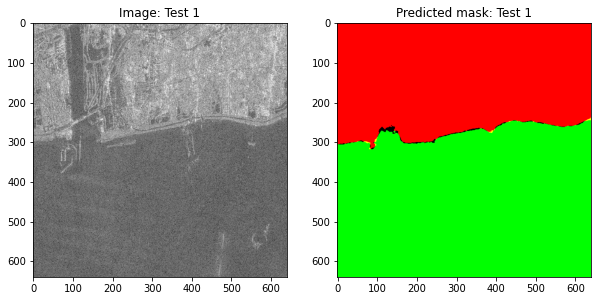

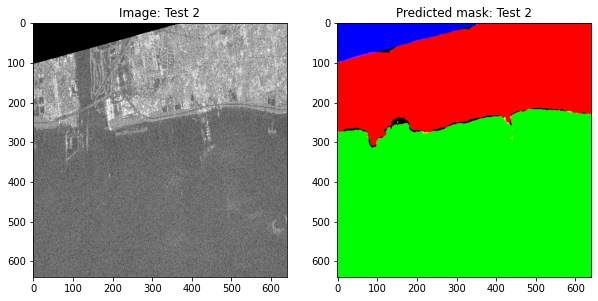

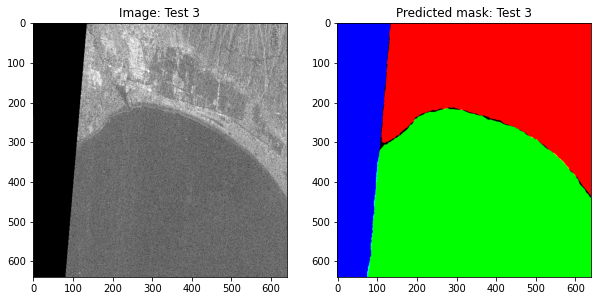

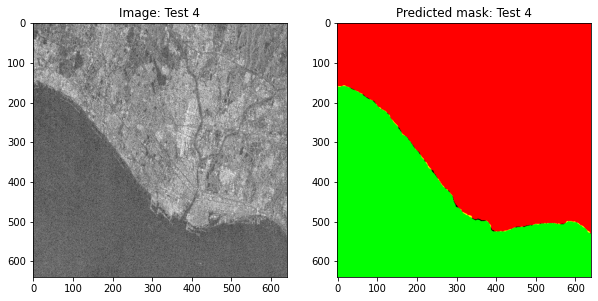

...

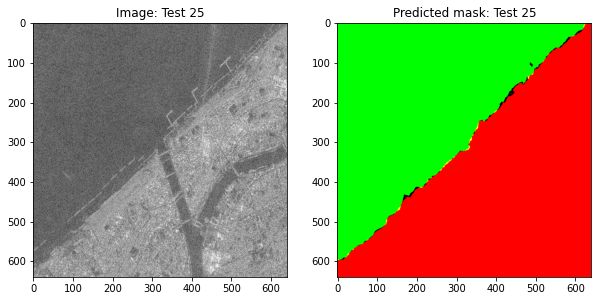

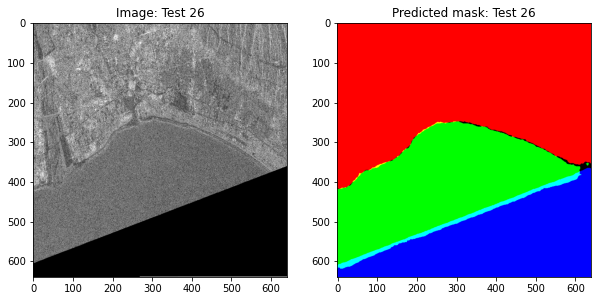

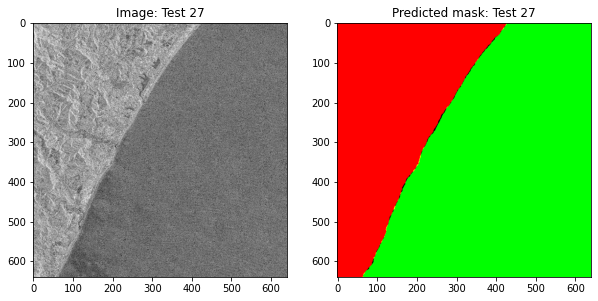

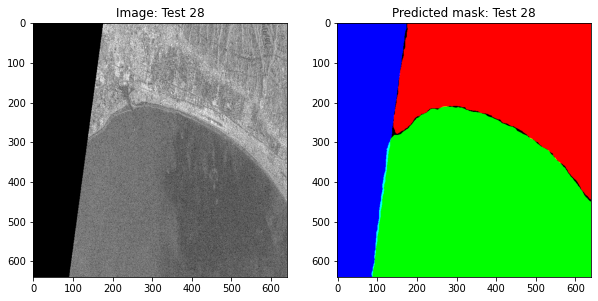

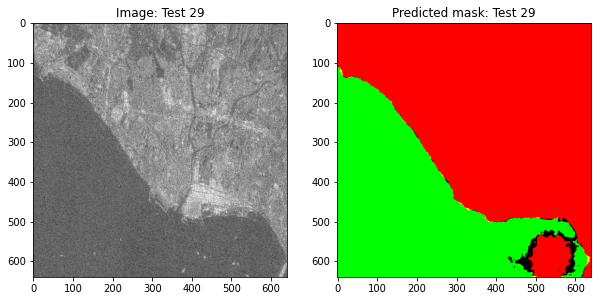

In [ ]:
# 予測結果(アンサンブル)を可視化①  ImageとPredicted Mask(annotation)を分けて表示
threshold = 0.5

for idx, features in enumerate(test_dataset):

    # catalyst.utilsのtensor_to_ndimageメソッドで、Tensorからnumpy.ndarrayに変換
    image = catalyst.utils.tensor_to_ndimage(features["image"])
    # Grayスケール用に単一chのみ抽出
    image = image[:, :, 0]

    # 予測結果をアンサンブル
    mask_ = ensemble_prediction(idx, predictions)

    # detachで勾配情報を切り離して、Tensor型　→ numpy.ndarray (dtype:float)に変換
    mask = catalyst.utils.detach(mask_ > threshold).astype("float")

    # チャネルファースト(C, H, W) -> チャネルラスト(H, W, C)にtranspose
    mask = mask.transpose(1, 2, 0)

    show_predictions(name="Test {}".format(idx), image=image, mask=mask)

- 海、陸、欠損でおおよそ予測できていることを確認。

### 2.8.2 testデータと推論結果を重ねて可視化

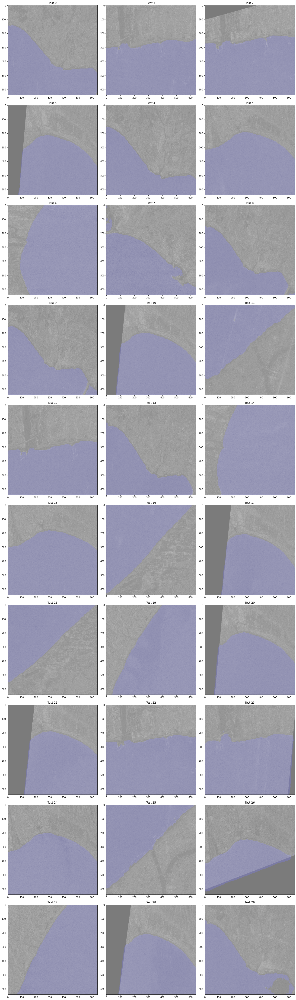

In [ ]:
# 予測結果(アンサンブル)を可視化①  ImageとPredicted Mask(annotation)を重ねて表示

# 最大表示数
max_display_count = 30
# 予測結果の閾値
threshold = 0.5
# 予測マスクの透過度
alpha = 0.3
# 列数
ncols = 3
# 行数(=10)
nrows = max_display_count // ncols
# 10行3列で予測結果を表示
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 6*nrows))

# test_datasetからテストデータを取り出し、イテレーション
for test_idx, features in enumerate(test_dataset):

    # test_datasetから取り出したテストデータを、
    # Tensor型: (C, H, W) → numpy.ndarray型: (H, W, C) に変換
    image = catalyst.utils.tensor_to_ndimage(features["image"])

    # 予測結果から海クラス(1)だけ抽出してアンサンブル mask_ [0, 1]
    mask_ = ensemble_prediction(test_idx, predictions, is_choice_sea_only=True)

    # アンサンブルさせた予測結果を、threshold(=0.5)以上でフィルタリングし、
    # detachで勾配情報を切り離して、Tensor型　→ numpy.ndarray (dtype:float)に変換
    mask_ = catalyst.utils.detach(mask_ > threshold).astype("float")

    # テストデータと同じshapeで、要素０のnump.ndarrayを用意
    image_ = np.zeros(shape=(image.shape))
    # 0ch(赤色),1ch(緑色)はそのままコピー
    image_[:, :, 0] = image_[:, :, 1] = image[:, :, 0].copy()
    # 2ch(青色)はマスクを透過させる
    image_[:, :, 2] = np.where(mask_,
                               ((1 - alpha) * image[:, :, 0].copy() + alpha*1.0),
                               image[:, :, 0].copy())

    # axesの行、列をdivmod()で計算
    row, col = divmod(test_idx, ncols)

    # ImageとPredicted Mask(annotation)を重ねて表示
    axes[row][col].imshow(image_)
    axes[row][col].set_title("Test {}".format(test_idx))
    if test_idx >= max_display_count:
        break

fig.tight_layout()

- おおよそ海と陸で予測できていることを確認

## 2.9 提出ファイルJSONの作成
セマンティックセグメンテーションの予測結果を投稿ファイル形式のJSONに変換して保存する。

In [ ]:
# test画像でトリミングした場合のオフセットを指定
# オフセットなし ->  None
# オフセットありの場合はタプルで指定 -> (y, x)

offset_list = [None] * 30

# test_10は余白をオフセットする。
# (y, x)
offset_list[10] = (0, 400)

# テストデータとオフセットの有無を確認
for idx, offset in enumerate(offset_list):
    print(f'test_{idx:02d}: {offset}')

test_00: None
test_01: None
test_02: None
test_03: None
test_04: None
test_05: None
test_06: None
test_07: None
test_08: None
test_09: None
test_10: (0, 400)
test_11: None
test_12: None
test_13: None
test_14: None
test_15: None
test_16: None
test_17: None
test_18: None
test_19: None
test_20: None
test_21: None
test_22: None
test_23: None
test_24: None
test_25: None
test_26: None
test_27: None
test_28: None
test_29: None


In [ ]:
# 提出ファイルJSON化の前に辞書オブジェクトを作成
# 各画像の予測点(Point Size)が30,000点を超えていないことを確認すること。

# 各testデータの海岸線の座標を格納するdict型変数を用意
anno_dict_all = {}

for test_idx in range(30):
    print(f'test_idx : {test_idx}')
    # testデータから海岸線の座標を抽出し、anno_dict_allに格納
    ret = get_filename_anno(test_idx, offset_list, predictions, threshold=0.4)
    anno_dict_all.update(ret)

test_idx : 0
Point Size : 6819
test_idx : 1
Point Size : 3165
test_idx : 2
Point Size : 3054
test_idx : 3
Point Size : 11733
test_idx : 4
Point Size : 6428
test_idx : 5
Point Size : 10982
test_idx : 6
Point Size : 10306
test_idx : 7
Point Size : 1558
test_idx : 8
Point Size : 8253
test_idx : 9
Point Size : 9280
test_idx : 10
Point Size : 12473
test_idx : 11
Point Size : 3411
test_idx : 12
Point Size : 3437
test_idx : 13
Point Size : 7593
test_idx : 14
Point Size : 9172
test_idx : 15
Point Size : 9714
test_idx : 16
Point Size : 10844
test_idx : 17
Point Size : 11920
test_idx : 18
Point Size : 11001
test_idx : 19
Point Size : 5339
test_idx : 20
Point Size : 11641
test_idx : 21
Point Size : 10710
test_idx : 22
Point Size : 3056
test_idx : 23
Point Size : 4576
test_idx : 24
Point Size : 10582
test_idx : 25
Point Size : 3910
test_idx : 26
Point Size : 17118
test_idx : 27
Point Size : 4952
test_idx : 28
Point Size : 12104
test_idx : 29
Point Size : 11774


In [ ]:
# 辞書オブジェクトを提出用JSONファイルとして保存
json_filename = str(ROOT / "logs/submit_20201106_size640_thresh04_LOGO_ensemble_test.json")
with open(json_filename, 'w') as f:
    json.dump(anno_dict_all, f)

### 2.9.1 テストデータに推論した海岸線を重ね合わせて可視化

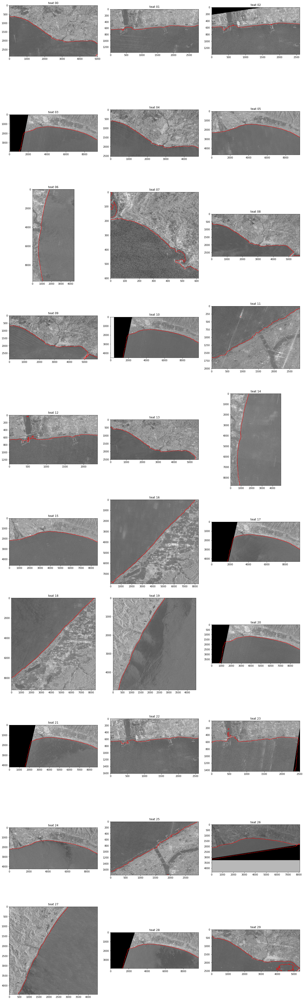

In [ ]:
# オリジナルサイズのテスト画像のパスを、グローバル変数TESET_ORG_IMAGESに格納
test_org_image_path = ROOT / "test_image_org"
TEST_ORG_IMAGES = sorted(test_org_image_path.glob("*.png"))

# 表示させる最大画像枚数
max_count = 30
# 3列
ncols = 3
# 10行
nrows = max_count // ncols

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 6*nrows))
for idx in range(max_count):
    # テストデータを可視化
    data = cv2.imread(str(TEST_ORG_IMAGES[idx]))
    row, col = divmod(idx, ncols)
    ax[row][col].set_title(f"teat {idx:02d}")
    ax[row][col].imshow(data)

    # 推論した海岸線を赤色でプロット
    for point in anno_dict_all[f"test_{idx:02d}.tif"]:
        ax[row][col].plot(point[0], point[1], ",", color="red")

fig.tight_layout()

## 2.10 推論結果まとめ
- セマンティックセグメンテーションの予測結果から、概ね海岸線を予測できていることが確認できました。
- 本予測モデルでは、public boardのスコアが26.7187758、private boardでのスコアが22.7821334となり、最終スコアが上がりました。過学習が抑えられたモデルが構築できていたと考えられます。

メモ
- numpy.ndarrayとtorch.tensorを、それぞれnp.greater()に入れたときの振る舞いの違いについて。

In [ ]:
# torch.tensorを用意
test_tensor = torch.arange(20).reshape(4, 5)
print(test_tensor.dtype)
test_tensor

torch.int64


tensor([[ 0,  1,  2,  3,  4],
        [ 5,  6,  7,  8,  9],
        [10, 11, 12, 13, 14],
        [15, 16, 17, 18, 19]])

In [ ]:
# numpy.ndarrayを用意
test_array = np.arange(20).reshape(4, 5)
print(test_array.dtype)
test_array

int64


array([[ 0,  1,  2,  3,  4],
       [ 5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14],
       [15, 16, 17, 18, 19]])

In [ ]:
# np.greaterは、Tensor型を入れると、0,1のtorch.uint8型で返される。
np.greater(test_tensor, 5)

tensor([[0, 0, 0, 0, 0],
        [0, 1, 1, 1, 1],
        [1, 1, 1, 1, 1],
        [1, 1, 1, 1, 1]], dtype=torch.uint8)

In [ ]:
# np.greaterは、numpy.ndarrayを入れると、True, Falseのbool型のnumpy.ndarrayで返される。
np.greater(test_array, 5)

array([[False, False, False, False, False],
       [False,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True]])

In [ ]:
# Boolean型のnumpy.ndarrayをnp.uint8で型変換すると、Falseは０、Trueは1に変換される
np.greater(test_array, 5).astype(np.uint8)

array([[0, 0, 0, 0, 0],
       [0, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1]], dtype=uint8)

メモ：np.greater()について、  
- Tensor型を入れると、0,1のtorch.uint8型で返される（2値化される）
- numpy.ndarrayを入れると、True, Falseのbool型のnumpy.ndarrayで返される。
    - np.uint8で型変換すると、Falseは0、Trueは1に変換される。